In [3]:
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
from gensim import models
%matplotlib inline
import pickle
import numpy as np
import pandas as pd
import warnings
from collections import OrderedDict
import wordcloud

warnings.filterwarnings("ignore")

/usr/local/lib/python3.6/dist-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


In [0]:
def get_topic_table(followers_data,lambda_optim=0.6):

  df = followers_data.topic_info
  df['relevance'] = df.apply(lambda x: lambda_optim*x['logprob'] + (1-lambda_optim)*x['loglift'], axis=1)

  nt = len(followers_data.topic_order)
  topics = [f'Topic{i+1}' for i in range(nt)]
  topic_list = []
  topn = 15
  topic_dict = OrderedDict()
  for topic in topics:
    topic_i = df.loc[df['Category']==topic].sort_values(by='relevance',ascending=False).reset_index(drop=True)
    terms_in_topic = topic_i.loc[:topn-1,'Term'].tolist()
    scores = np.exp(topic_i['relevance'].values)
    scores = list(scores/sum(scores))
    scores_in_topic = scores[:topn]
    topic_dict[topic] = [(term,scores_in_topic[i]) for i,term in enumerate(terms_in_topic)]

  columns = ['Topic']+[f'term {i+1}' for i in range(topn)]
  topic_freqs = followers_data.topic_coordinates.drop(columns=['cluster','x','y']).reset_index(drop=True).rename(columns={'Freq':'frequency','topics':'topic'}).set_index('topic')
  return topic_freqs,topic_dict

In [0]:
def plot_wordcloud(freq_topics,topic_dict,lb=0,ub=100):
  topic_list = freq_topics.loc[(freq_topics['frequency']<=ub) & (freq_topics['frequency']>=lb)].index.tolist()
  num_topics = len(topic_list)
  figure = plt.figure(figsize=(20,4*np.ceil(num_topics/5)))

  for i,topic_id in enumerate(topic_list):
    ax = figure.add_subplot(np.ceil(num_topics/5),5,i+1)
    list_tuples = topic_dict[f'Topic{topic_id}']
    freqs = {item[0]:item[1] for item in list_tuples}

    wc = wordcloud.WordCloud(width=400,
                            height=400,
                            background_color='white',)
    wc.fit_words(freqs)
    
    ax.imshow(wc.recolor(), interpolation="bilinear",axes=ax)
    ax.set_title(f"in {str(np.round(freq_topics.at[topic_id,'frequency'],2))}% of docs",color='k',fontsize=18)
    plt.axis('off')

# Visualize best LDA models

In [0]:
# Initialize Parameters
path = 'drive/My Drive/Twitter project/LDA_results/'


Below we report results of 4 different runs of the LDA model (each one with a different random seed)

#### Model 1

In [7]:
lda_filename  = path+"noverbs_bigrams_islanders_fans_nt60_pa100_alphasymmetric_rs3000"
with open(lda_filename+'.pickle', 'rb') as handle:
  followers_data = pickle.load(handle)[0]

freq_topics_1, topic_dict_1 = get_topic_table(followers_data)
pyLDAvis.display(followers_data)


Topics present in more than 5% of corpus documents 

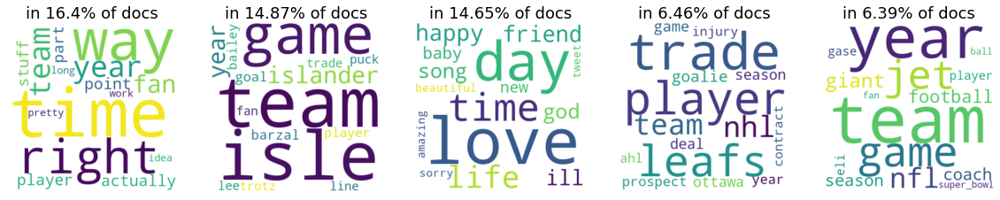

In [8]:
plot_wordcloud(freq_topics_1,topic_dict_1,lb=5)

Topics present within 1-5% of corpus documents 

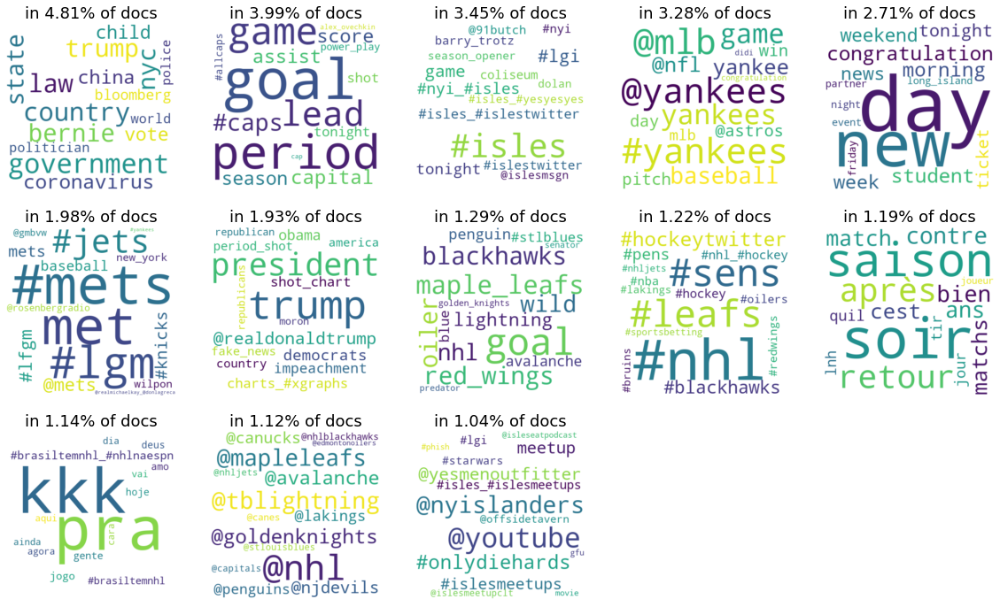

In [9]:
plot_wordcloud(freq_topics_1,topic_dict_1,1,5)

Topics present in less than 1% of corpus documents 

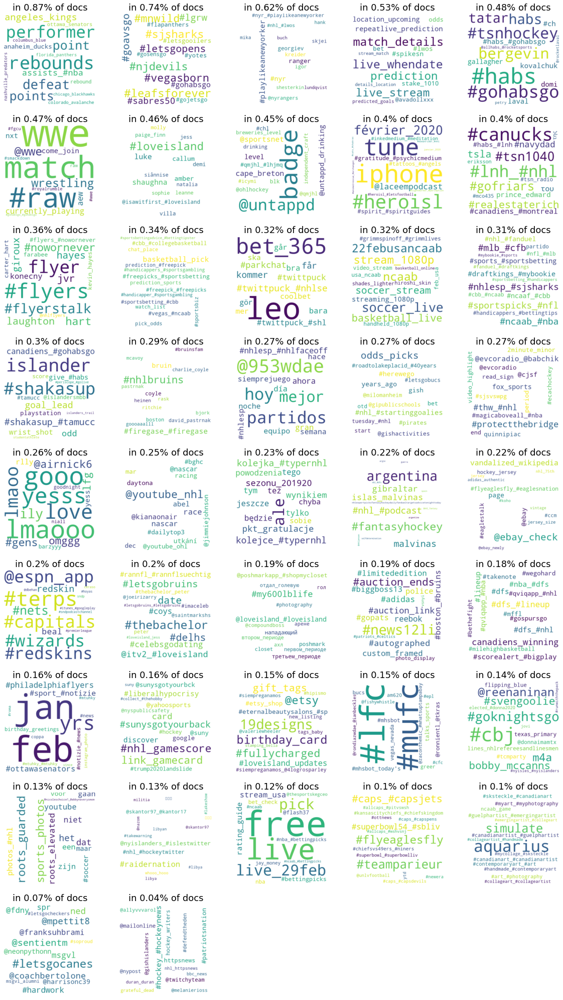

In [10]:
plot_wordcloud(freq_topics_1,topic_dict_1,lb=0,ub=1)

#### Model 2

In [11]:
lda_filename  = path+"noverbs_bigrams_islanders_fans_nt60_pa100_alphasymmetric_rs4000"
with open(lda_filename+'.pickle', 'rb') as handle:
  followers_data = pickle.load(handle)[0]
  

freq_topics_2, topic_dict_2 = get_topic_table(followers_data)
pyLDAvis.display(followers_data)


Topics present in more than 5% of corpus documents 

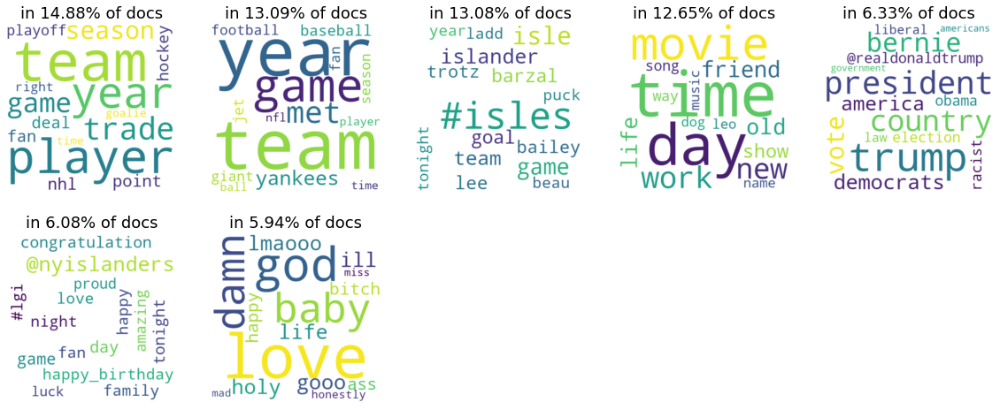

In [12]:
plot_wordcloud(freq_topics_2,topic_dict_2,lb=5)

Topics present within 1-5% of corpus documents 

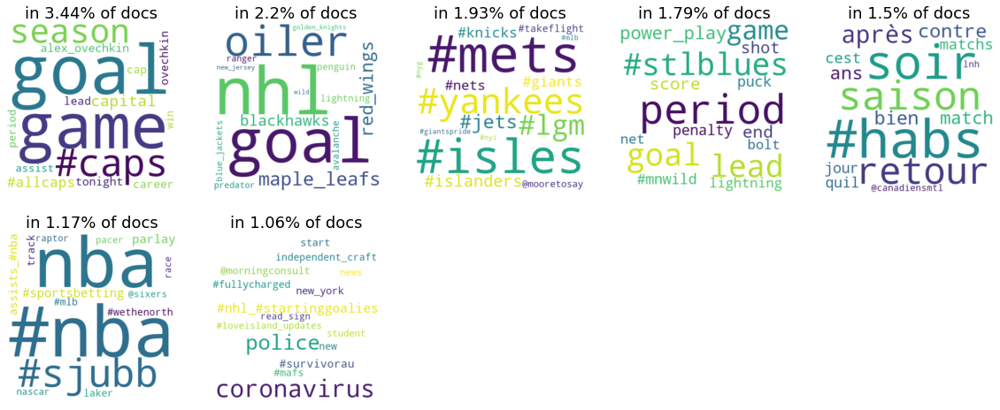

In [13]:
plot_wordcloud(freq_topics_2,topic_dict_2,1,5)

Topics present in less than 1% of corpus documents 

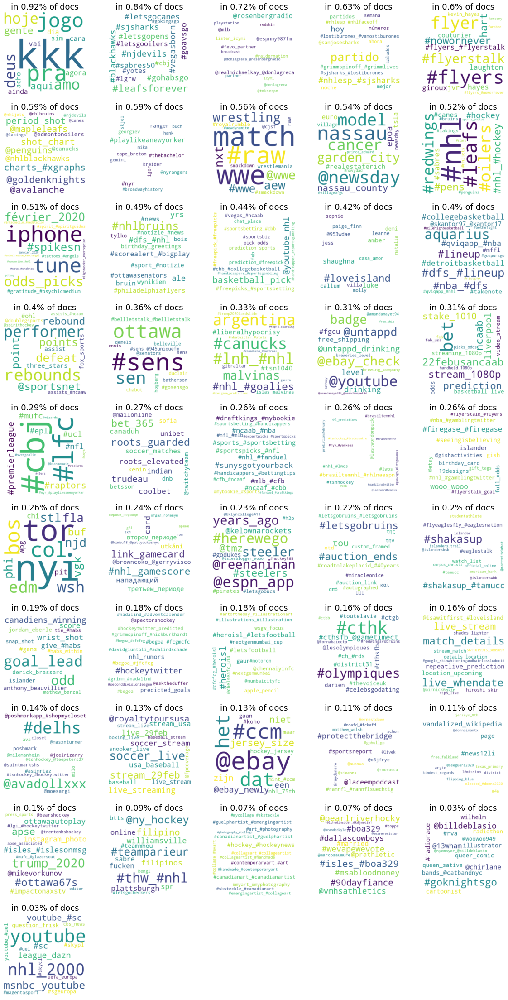

In [14]:
plot_wordcloud(freq_topics_2,topic_dict_2,lb=0,ub=1)

#### Model 3

In [15]:
lda_filename  = path+"noverbs_bigrams_islanders_fans_nt60_pa100_alphasymmetric"
with open(lda_filename+'.pickle', 'rb') as handle:
  followers_data = pickle.load(handle)[0]
  
freq_topics_3, topic_dict_3 = get_topic_table(followers_data)
pyLDAvis.display(followers_data)

Topics present in more than 5% of corpus documents 

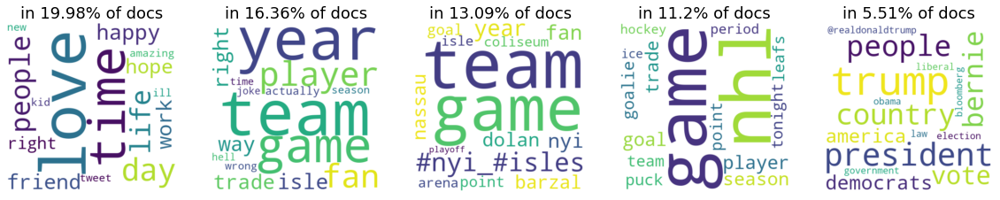

In [16]:
plot_wordcloud(freq_topics_3,topic_dict_3,lb=5)

Topics present within 1-5% of corpus documents 

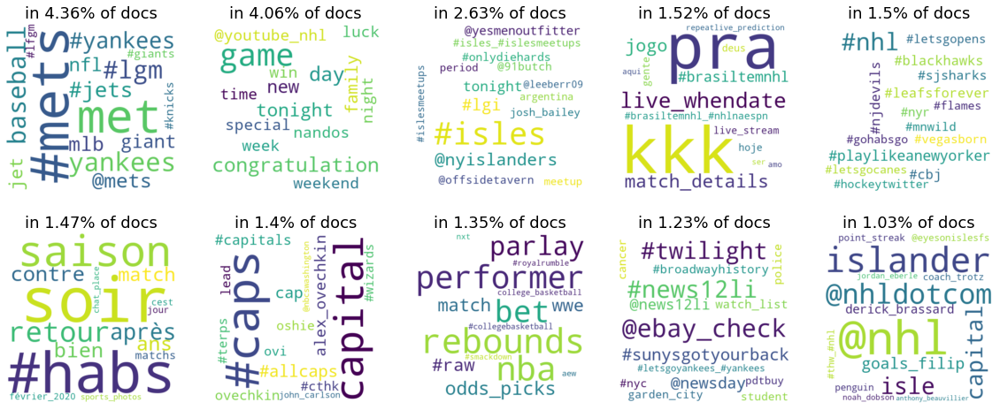

In [17]:
plot_wordcloud(freq_topics_3,topic_dict_3,1,5)

Topics present in less than 1% of corpus documents 

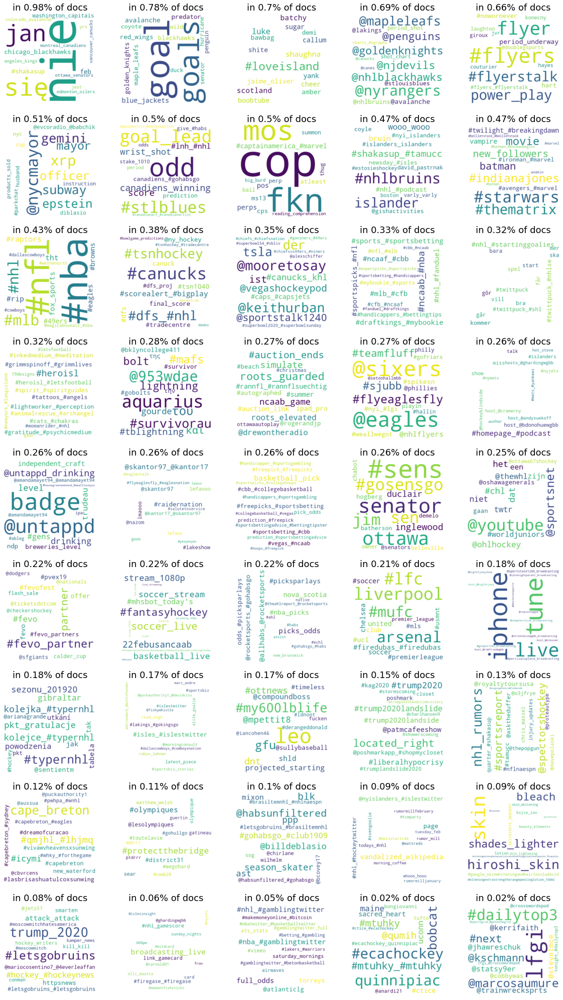

In [18]:
plot_wordcloud(freq_topics_3,topic_dict_3,lb=0,ub=1)

#### Model 4

In [19]:
lda_filename  = path+"noverbs_bigrams_old_islanders_fans_nt60_pa100_alphasymmetric_rs2000"
with open(lda_filename+'.pickle', 'rb') as handle:
  followers_data = pickle.load(handle)[0]
  

freq_topics_4, topic_dict_4 = get_topic_table(followers_data)
pyLDAvis.display(followers_data)


Topics present in more than 5% of corpus documents 

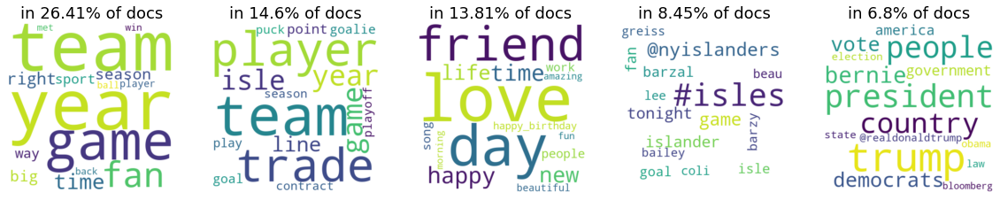

In [20]:
plot_wordcloud(freq_topics_4,topic_dict_4,lb=5)

Topics present within 1-5% of corpus documents 

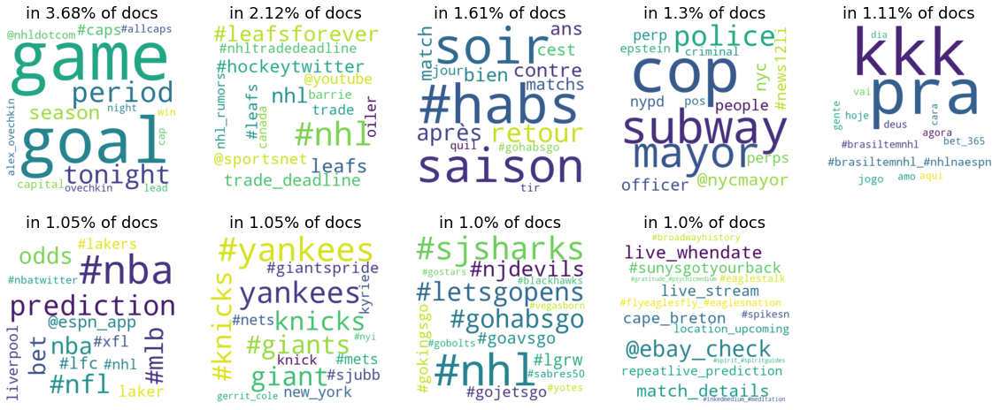

In [21]:
plot_wordcloud(freq_topics_4,topic_dict_4,1,5)

Topics present in less than 1% of corpus documents 

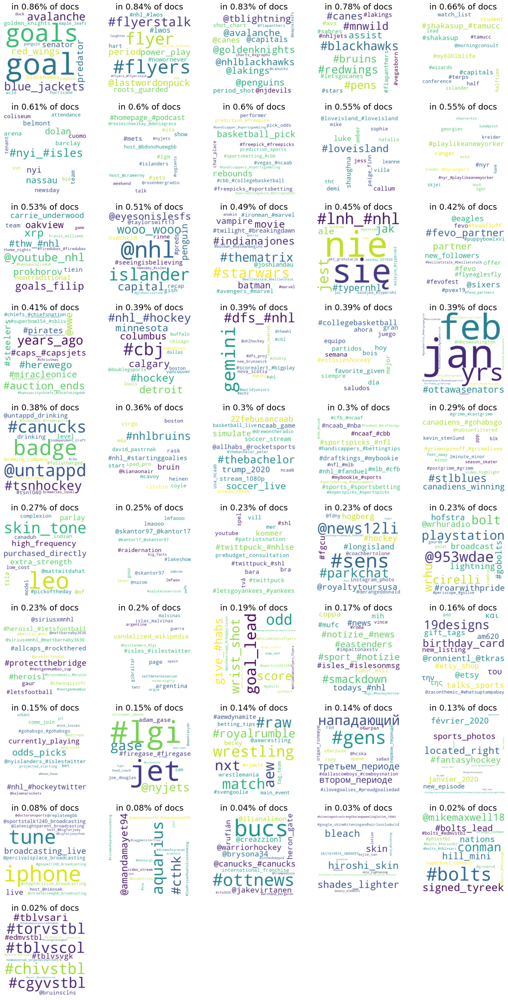

In [22]:
plot_wordcloud(freq_topics_4,topic_dict_4,lb=0,ub=1)

#### Model 5

In [23]:
lda_filename  = path+"noverbs_bigrams_old_islanders_fans_nt60_pa100_alphasymmetric_rs1000"
with open(lda_filename+'.pickle', 'rb') as handle:
  followers_data = pickle.load(handle)[0]
  
freq_topics_3, topic_dict_3 = get_topic_table(followers_data)
pyLDAvis.display(followers_data)

Topics present in more than 5% of corpus documents 

In [24]:
plot_wordcloud(freq_topics_5,topic_dict_5,lb=5)

NameError: ignored

Topics present within 1-5% of corpus documents 

In [0]:
plot_wordcloud(freq_topics_5,topic_dict_5,1,5)

Topics present in less than 1% of corpus documents 

In [0]:
plot_wordcloud(freq_topics_5,topic_dict_5,lb=0,ub=1)